In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.style as style
from tqdm import tqdm 
tqdm.pandas()
plt.rcParams.update({'axes.labelsize':16})
plt.rcParams.update({'axes.titlesize':16})
plt.rcParams.update({'legend.fontsize':16})
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['lines.linewidth'] = 4
style.use('ggplot')
import os
os.chdir('../')
from python_code import simple_gibbs
os.chdir('notebooks')
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression

In [2]:
from scipy.stats import norm
from ridgeplot import ridgeplot

In [3]:
pca = PCA(n_components=2)
df = pd.read_csv('all_data.csv')
df = df.drop(columns='transit_stations_percent_change_from_baseline')
df = df.dropna()
df['department_name'] = df['department_name'].apply(lambda x: " ".join(x.split(' ')[:-1]))
X_transformed = pca.fit_transform(df[df.columns[np.r_[1:4,5:7]]])
df['component_1'] = X_transformed[:,0]
df['component_2'] = X_transformed[:,1]
df['intercept'] = 1
grouped_df = df.groupby('department_name')
groups = list(grouped_df.groups.keys())

In [4]:
X_depts, y_depts = [], []
pca = PCA(n_components=2)
time_vecs = []
date_vecs = []
for n, dept in enumerate(groups):
    df_dept = grouped_df.get_group(dept)
    df_dept = df_dept.sort_values('date')
    date_vecs.append(df_dept['date'])
    X = df_dept[['intercept','component_1','component_2']].to_numpy()
    y = df_dept['incidents'].to_numpy()
    X_depts.append(X)
    y_depts.append(y.flatten())
    df_dept['day_of_the_year'] = pd.to_datetime(df_dept['date']).dt.day_of_year
    time_vecs.append(df_dept['day_of_the_year'].to_numpy())

In [5]:
gb = simple_gibbs.GibbsSampler(X_depts, y_depts, time_vecs, n_iter=1000)
gb.fit()

  0%|                                                                                                                                                                    | 0/1000 [00:00<?, ?it/s]/Users/juliette/Documents/repos/SDS383D_JF/project/python_code/simple_gibbs.py:116: RuntimeWarning: invalid value encountered in double_scalars
  ratio = np.log(new_posterior / old_posterior)
/Users/juliette/Documents/repos/SDS383D_JF/project/python_code/simple_gibbs.py:116: RuntimeWarning: divide by zero encountered in double_scalars
  ratio = np.log(new_posterior / old_posterior)
  0%|▎                                                                                                                                                           | 2/1000 [00:00<03:54,  4.25it/s]/Users/juliette/Documents/repos/SDS383D_JF/project/python_code/simple_gibbs.py:116: RuntimeWarning: divide by zero encountered in log
  ratio = np.log(new_posterior / old_posterior)
100%|████████████████████████████████████████

In [19]:
import plotly.offline as pyo
pyo.init_notebook_mode()


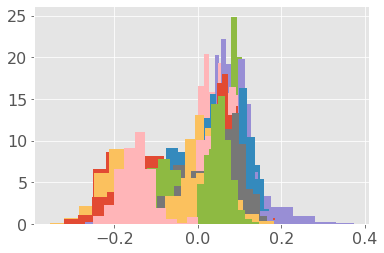

In [20]:
for i in range(len(groups)):
    plt.hist(gb.traces['betas'][:,1,i], density=True);

In [32]:
corr_mats = [gb.traces['corr_mats'][n][:,:,:500].mean(axis=2) for n in range(len(groups))]
corr_mats[0]

array([[11.98654467,  7.79287935,  3.8495662 , ...,  0.03      ,
         0.03      ,  0.03      ],
       [ 7.79287935, 11.98654467,  7.79287935, ...,  0.03      ,
         0.03      ,  0.03      ],
       [ 3.8495662 ,  7.79287935, 11.98654467, ...,  0.03      ,
         0.03      ,  0.03      ],
       ...,
       [ 0.03      ,  0.03      ,  0.03      , ..., 11.98654467,
         7.79287935,  3.8495662 ],
       [ 0.03      ,  0.03      ,  0.03      , ...,  7.79287935,
        11.98654467,  7.79287935],
       [ 0.03      ,  0.03      ,  0.03      , ...,  3.8495662 ,
         7.79287935, 11.98654467]])

(array([ 41., 118., 101.,  81.,  53.,  27.,  29.,   7.,  21.,  22.]),
 array([ 0.        ,  1.767214  ,  3.53442799,  5.30164199,  7.06885598,
         8.83606998, 10.60328397, 12.37049797, 14.13771197, 15.90492596,
        17.67213996]),
 <BarContainer object of 10 artists>)

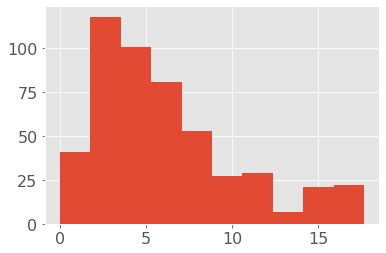

In [33]:
plt.hist(gb.traces['sigmas_squared'][:,15])

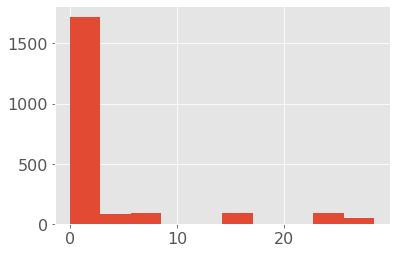

In [34]:
plt.hist(gb.corr_mats[0].flatten());

In [35]:
len(gb.corr_mats)

42

In [36]:
len(gb.traces['corr_mats'][0])

46

In [37]:
def make_ridge(beta_no, b=.5):
    fig = ridgeplot(
    samples=gb.traces['betas'][:,beta_no,:].T,
    bandwidth=b,
    kde_points=np.linspace(gb.traces['betas'][:,beta_no,:].min(), gb.traces['betas'][:,beta_no,:].max(), 400),
    colorscale="peach",
    colormode="mean-means",
    coloralpha=0.6,
    labels=groups,
    spacing=5 / 9,
)
    fig.update_layout(showlegend=False, height=900,
    width=1000, title=f'\u03B2<sub>{beta_no}</sub> per department', title_x=0.5,  plot_bgcolor="rgba(255, 255, 255, 0.0)")
    fig.show()



In [38]:
make_ridge(0,b=2)

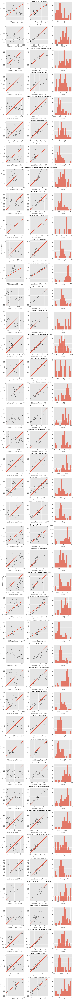

In [41]:
plt.figure(figsize=(12, 160))
betas = gb.traces['betas'].mean(axis=0)
hierarchical_res = []
for n in range(len(groups)):
    plt.subplot(len(groups), 3, 3*n + 1)
    plt.scatter(X_depts[n][:,1], y_depts[n], color='black', alpha=.5)
    x_1 = np.linspace(X_depts[n][:,1].min(), X_depts[n][:,1].max(), 100).reshape(-1,1)
    x_2 = np.linspace(X_depts[n][:,2].min(), X_depts[n][:,2].max(), 100).reshape(-1,1)
    xi = np.ones(100).reshape(-1,1)
    y_pred = np.hstack((xi, x_1, x_2))@betas[:, n]
    plt.plot(x_1, y_pred)
    plt.xlabel(f'component 1, beta 1 = {np.round(betas[1,n],3)}')
    plt.ylabel('% change incidents')
    plt.subplot(len(groups), 3, 3*n + 2)
    plt.title(groups[n])
    plt.scatter(X_depts[n][:,2], y_depts[n], color='black', alpha=.5)
    plt.plot(x_2, y_pred)
    plt.xlabel(f'component 2, beta 2 = {np.round(betas[2,n],3)}')
    plt.subplot(len(groups), 3, 3*n + 3)
    res = y_depts[n]-X_depts[n]@betas[:,n] - np.diag(corr_mats[n])
    plt.hist(res, alpha=.7, bins=15)
    hierarchical_res.append(res)
    plt.xlabel('residuals')
    
    
plt.tight_layout()
#plt.savefig('basic_results.png',bbox_inches='tight')

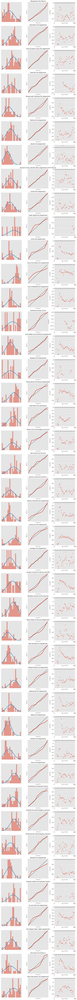

In [43]:
plt.figure(figsize=(12.5, 160))
all_residuals = []
    
for n, dept in enumerate(groups):
    plt.subplot(len(groups), 3, 3*n + 1)
    x_1 = np.linspace(X_depts[n][:,1].min(), X_depts[n][:,1].max(), 100).reshape(-1,1)
    x_2 = np.linspace(X_depts[n][:,2].min(), X_depts[n][:,2].max(), 100).reshape(-1,1)
    xi = np.ones(100).reshape(-1,1)
    y_pred = np.hstack((xi, x_1, x_2))@betas[:, n]
    residuals = hierarchical_res[n]
    plt.hist(residuals, alpha=.5, density=True, bins=20)
    plt.xticks([])
    plt.yticks([])
    mean = np.mean(residuals)
    var = np.var(residuals)
    min_x, max_x = np.min(residuals), np.max(residuals)
    x = np.linspace(min_x, max_x, 100)
    normal = norm(loc=mean, scale=np.sqrt(var))
    norm_pdf = normal.pdf(x)
    plt.plot(x, norm_pdf)
    plt.subplot(len(groups), 3, 3*n + 2)
    plt.title(dept)
    quants = np.linspace(0.1, 0.9, 10)
    quantiles_norm = normal.ppf(quants)
    quantiles_data = np.quantile(residuals, quants)
    plt.plot(quantiles_norm, quantiles_data)
    plt.xlabel('normal Q')
    plt.ylabel('data Q')
    plt.xticks([])
    plt.yticks([])
    plt.plot([quantiles_norm.min(), quantiles_norm.max()],[quantiles_norm.min(), quantiles_norm.max()], color='black', alpha=.5, linestyle='--')
    plt.subplot(len(groups), 3, 3*n + 3)
    plt.scatter(time_vecs[n], residuals, alpha=.7)
    plt.axhline(y=0, color='black',linestyle='--', alpha=.5)
    plt.xticks([0, 365])
    plt.xlabel('day of 2020', labelpad=-15)
    plt.ylabel('residuals')
plt.tight_layout()
    

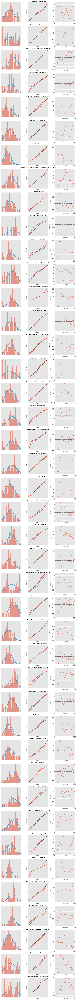

In [44]:
plt.figure(figsize=(12.5, 160))
all_residuals = []
    
for n, dept in enumerate(groups):
    plt.subplot(len(groups), 3, 3*n + 1)
    X, y = X_depts[n], y_depts[n]
    reg = LinearRegression()
    reg.fit(X, y)
    residuals = y - reg.predict(X)
    all_residuals.append(residuals)
    plt.hist(residuals, alpha=.5, density=True, bins=20)
    plt.xticks([])
    plt.yticks([])
    mean = np.mean(residuals)
    var = np.var(residuals)
    min_x, max_x = np.min(residuals), np.max(residuals)
    x = np.linspace(min_x, max_x, 100)
    normal = norm(loc=mean, scale=np.sqrt(var))
    norm_pdf = normal.pdf(x)
    plt.plot(x, norm_pdf)
    plt.subplot(len(groups), 3, 3*n + 2)
    plt.title(dept)
    quants = np.linspace(0.1, 0.9, 10)
    quantiles_norm = normal.ppf(quants)
    quantiles_data = np.quantile(residuals, quants)
    plt.plot(quantiles_norm, quantiles_data)
    plt.xlabel('normal Q')
    plt.ylabel('data Q')
    plt.xticks([])
    plt.yticks([])
    plt.plot([quantiles_norm.min(), quantiles_norm.max()],[quantiles_norm.min(), quantiles_norm.max()], color='black', alpha=.5, linestyle='--')
    plt.subplot(len(groups), 3, 3*n + 3)
    plt.scatter(time_vecs[n], all_residuals[n], alpha=.7)
    plt.axhline(y=0, color='black',linestyle='--', alpha=.5)
    plt.xticks([0, 365])
    plt.xlabel('day of 2020', labelpad=-15)
    plt.ylabel('residuals')
plt.tight_layout()
    

In [45]:
all_days_2020 = pd.DataFrame(pd.date_range("2020", freq="D", periods=365))
all_days_2020.columns = ['date']
mondays_of_2020 = all_days_2020[all_days_2020['date'].dt.dayofweek == 0].reset_index()

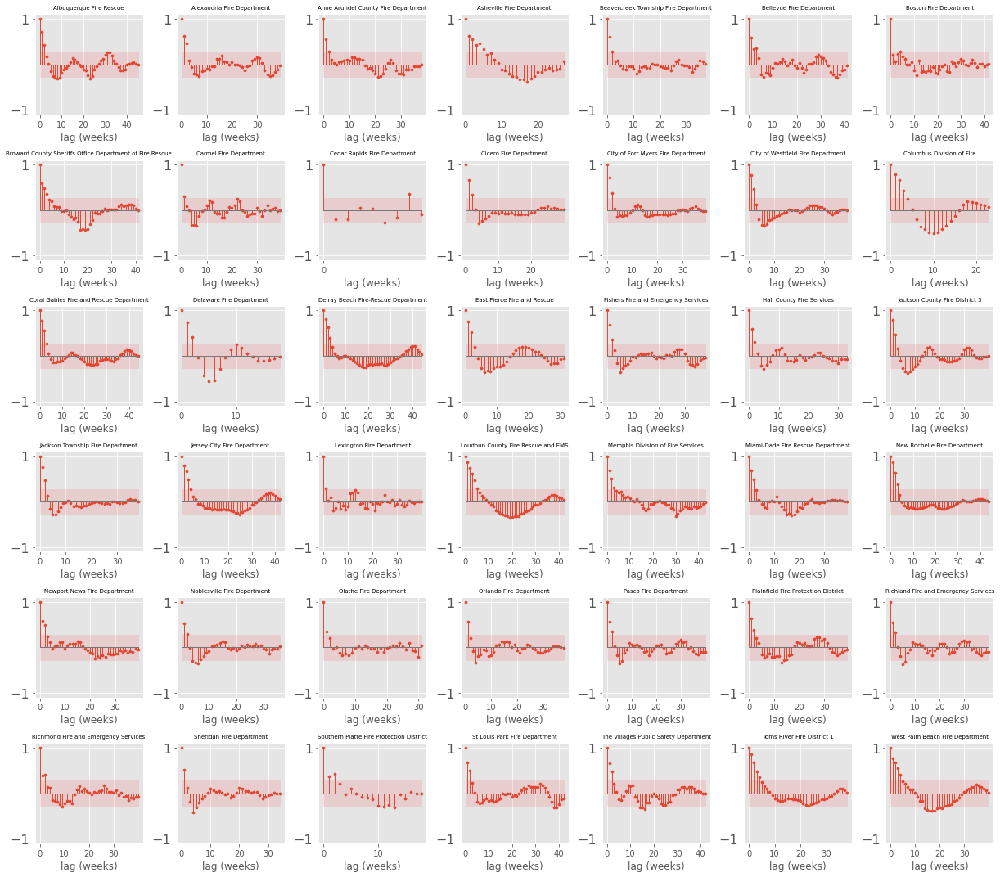

In [46]:
plt.figure(figsize=(17, 15))

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf
corr_dfs = []
for i in range(len(hierarchical_res)):
    plt.subplot(6, 7, i + 1)
    df_corr = pd.DataFrame(data = np.vstack([date_vecs[i], hierarchical_res[i].flatten()]).T)
    df_corr.columns = ['date', 'residual']
    df_corr['date'] =  pd.to_datetime(df_corr['date'])
    df_corr['residual'] = df_corr['residual']
    merged_df = pd.merge(mondays_of_2020, df_corr, how='outer', on='date')
    corr_dfs.append(merged_df)
    nlags=len(hierarchical_res[i])-1
    data, CI = acf(merged_df['residual'],  nlags=nlags,  missing='drop', alpha=.05, bartlett_confint = False
)
    lags = np.arange(0, len(hierarchical_res[i]), 1)
    plt.scatter(lags, data, s=10)
    _, stemlines, baseline = plt.stem(lags, data, markerfmt=' ')
    plt.setp(stemlines, 'linewidth', 1)
    plt.setp(baseline, 'linewidth', 1)
    
    plt.xticks(np.arange(0,nlags,10), fontsize=10)
    plt.ylim(-1.1,1.1)
    plt.yticks([-1,1])
    plt.xlabel('lag (weeks)')
    plt.fill_between(lags,CI[:,0]-data, CI[:,1]-data, alpha=.1, color='red')
    plt.title(groups[i], fontsize=7)
    
plt.tight_layout()
    
#plt.subplots_adjust(left=0.1,
             #       bottom=0.1, 
             #       right=1.5, 
              #      top=0.9, 
              #      wspace=0.4, 
              #      hspace=0.4)   

#plt.savefig('acf_plots.png',bbox_inches='tight', dpi=200)   
   

In [ ]:
plt.figure(figsize=(17, 15))

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf
corr_dfs = []
for i in range(len(hierarchical_res)):
    df_corr = pd.DataFrame(data = np.vstack([date_vecs[i], all_residuals[i].flatten()]).T)
    df_corr.columns = ['date', 'residual']
    df_corr['date'] =  pd.to_datetime(df_corr['date'])
    merged_df = pd.merge(mondays_of_2020, df_corr, how='outer', on='date')
    corr_dfs.append(merged_df)
    data, CI = acf(merged_df['residual'],  nlags=52,  missing='drop', alpha=.05, bartlett_confint = False
)
    try:
        plot_acf(merged_df['residual'],  missing='drop',bartlett_confint = False)
    except:
        pass
    
   
    
#plt.subplots_adjust(left=0.1,
             #       bottom=0.1, 
             #       right=1.5, 
              #      top=0.9, 
              #      wspace=0.4, 
              #      hspace=0.4)   

#plt.savefig('acf_plots.png',bbox_inches='tight', dpi=200)   
   

In [ ]:
plt.hist(gb.traces['mu'][:,2], density=True, alpha=.5);
plt.hist(gb.traces['mu'][:,1], density=True, alpha=.5);
plt.hist(gb.traces['mu'][:,0], density=True, alpha=.5);

In [ ]:
plt.plot(gb.traces['betas'][:,2,:]);

In [ ]:
plt.plot(gb.traces['betas'][:,0,:].mean(axis=0))

In [ ]:
pca = PCA(n_components=2)
df = pd.read_csv('all_data.csv')
grouped_df = df.groupby('department_name')
groups = list(grouped_df.groups.keys())
#X_transformed = pca.fit_transform(df[df.columns[np.r_[1:4,5:7]]])
#df['component_1'] = X_transformed[:,0]
#df['component_2'] = X_transformed[:,1]
#df['intercept'] = 1
#grouped_df = df.groupby('department_name')
#groups = list(grouped_df.groups.keys())

In [ ]:
for n, dept in enumerate(groups):
    df_dept = grouped_df.get_group(dept)
    if df_dept.dropna().empty:
        print(dept)
        print(df_dept)


In [ ]:
gb.traces['betas'][:,:,:].mean(axis=0).mean(axis=1)

In [ ]:
plt.plot(gb.traces['betas'][:,0,:]);

In [ ]:
class hey:
    def __init__(self):
        self.a = np.ones(3)
    def hello(self):
#         setattr(self, 'a[0]', 5)
        self.a[0] = 5
        

In [ ]:
h=hey()

In [ ]:
h.hello()

In [ ]:
h.a

In [ ]:
plt.hist(gb.traces['mu'][:,0], alpha=.5)

In [ ]:
plt.plot(betas[0,:]);
plt.figure()
plt.plot(betas[1,:]);

In [ ]:
#plt.figure(figsize=(8, 160))
betas = gb.traces['betas'].mean(axis=0)
for n in range(len(groups)):

    x_1 = np.linspace(X_depts[n][:,1].min(), X_depts[n][:,1].max(), 100).reshape(-1,1)
    x_2 = np.linspace(X_depts[n][:,2].min(), X_depts[n][:,2].max(), 100).reshape(-1,1)
    xx1, xx2 = np.meshgrid(x_1, x_2)
    xi = np.ones(len(xx1.flatten()))
    x_plot = np.hstack((xi.reshape(-1,1), xx1.flatten().reshape(-1,1), xx2.flatten().reshape(-1,1)))
    y_pred = x_plot@betas[:, n]
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    ax.scatter(X_depts[n][:,1], X_depts[n][:,2], y_depts[n])
    ax.scatter(xx1.flatten(), xx2.flatten(), y_pred, alpha=.02)
    ax.set_title(groups[n])
    ax.set_xlabel('1')
    ax.set_ylabel('2')
    
    plt.figure()
    
    
#plt.tight_layout()
#plt.savefig('basic_results.png',bbox_inches='tight')

In [ ]:
plt.figure(figsize=(8, 160))
betas = gb.traces['betas'].mean(axis=0)
for n in range(len(groups)):
    plt.subplot(len(groups), 2, 2*n + 1)
    plt.title(groups[n], x=1.1)
    plt.scatter(X_depts[n][:,1], y_depts[n], color='black', alpha=.5)
    x_1 = np.linspace(X_depts[n][:,1].min(), X_depts[n][:,1].max(), 100).reshape(-1,1)
    x_2 = np.linspace(X_depts[n][:,2].min(), X_depts[n][:,2].max(), 100).reshape(-1,1)
    xi = np.ones(100).reshape(-1,1)
    y_pred = np.hstack((xi, x_1, x_2))@betas[:, n]
    plt.plot(x_1, y_pred)
    plt.xlabel(f'component 1, beta 1 ={np.round(betas[1,n],3)}')
    plt.ylabel('% change incidents')
    print(groups[n])
    print(betas[:,n])
    
  
    plt.subplot(len(groups), 2, 2*n + 2)
    plt.scatter(X_depts[n][:,2], y_depts[n], color='black', alpha=.5)
    plt.plot(x_2, y_pred)
    plt.xlabel(f'component 2, beta 2 = {np.round(betas[2,n],3)}')
plt.tight_layout()
plt.savefig('basic_results.png',bbox_inches='tight')


In [ ]:
plt.plot(gb.traces['sigmas_squared'].mean(axis=0))

In [ ]:
plt.figure(figsize=(10, 10))

x = groups
plt.scatter(x, gb.traces['betas'][:,1,:].mean(axis=0));
plt.axhline(y=0)
plt.xticks(rotation=90, fontsize=8);

In [ ]:
gb.traces['mu'].mean(axis=0)

In [ ]:
plt.plot(gb.traces['betas'][:,0,:]);

In [ ]:
plt.plot(gb.traces['mu']);

In [ ]:
gb.traces['mu'].mean(axis=0)

In [ ]:
plt.plot(gb.traces['betas'].mean(axis=0)[1,:])

In [ ]:
gb.taus

In [ ]:
gb.betas

In [ ]:
plt.plot(np.sqrt(gb.traces['sigmas_squared'][10:].mean(axis=0
                                                      ) ));

In [ ]:
plt.plot(gb.traces['sigmas_squared'][10:].mean(axis=0))

In [ ]:
plt.hist(gb.traces['sigmas_squared'][10:][:,-2])

In [ ]:
gb.traces['sigmas_squared'].shape

In [ ]:
gb.traces['mu'][0,:][:, None]

In [ ]:
gb.traces['betas'][0,:] - gb.traces['mu'][0,:][:, None]

In [ ]:
def hi(**kwargs):
    return kwargs

In [ ]:
hi(bandwith=1, hey=2)

In [ ]:
gb = simple_gibbs.GibbsSampler(X_depts, y_depts)